# Let's Grow More(LGMVIP) - "DATA SCIENCE INTERN"

# LGMVIP JULY-2023

# Author - Aalekhya M

# Task:ML Facial recognition to detect mood and suggest songs accordingly 

In [2]:
#Import Libraries/Packages
import numpy as np
import cv2
import os
import random
from skimage.io import imread
import pandas as pd
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, BatchNormalization, Conv2D,MaxPooling2D,Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
from IPython.display import Audio

In [3]:
print("TensorFlow version :", tf.__version__)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

TensorFlow version : 2.13.0
Num GPUs Available:  0


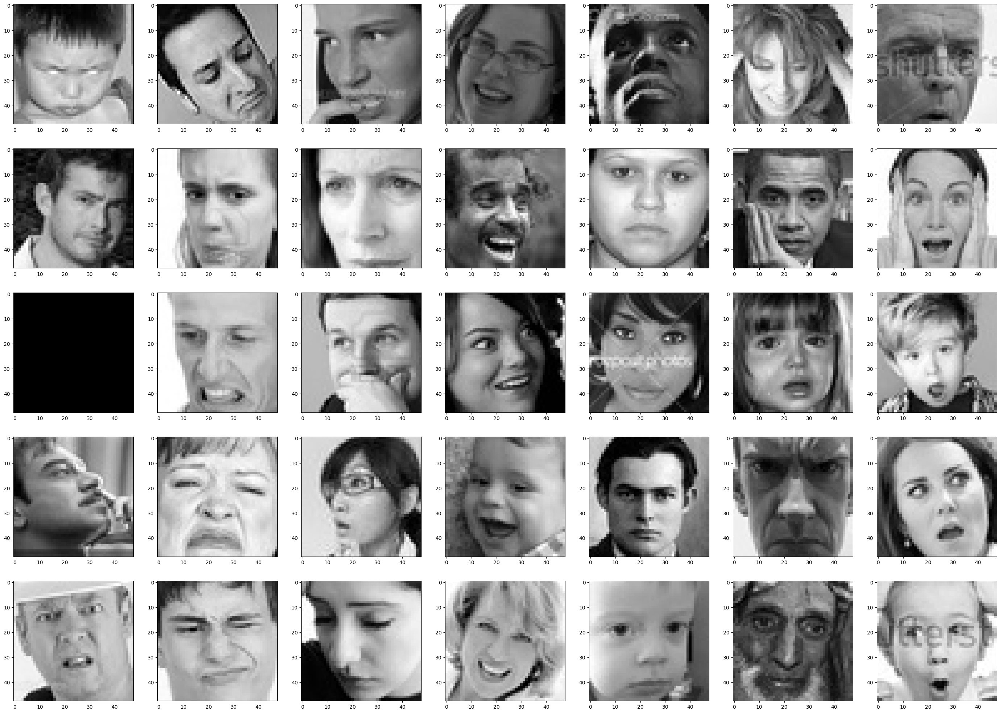

In [12]:
# Data Visualization
from skimage.io import imread
train_dir = 'datasets/train/'
test_dir = 'datasets/test/'
total_labels = len(os.listdir(train_dir))

fig, ax = plt.subplots(nrows=5, ncols=total_labels, figsize=(35, 25))
for x in range(5):
    for y,v in zip(range(total_labels),os.listdir(train_dir)):
        ax[x][y].imshow(imread(train_dir+v+'/'+os.listdir(train_dir+v)[x]), cmap='gray')

plt.show()

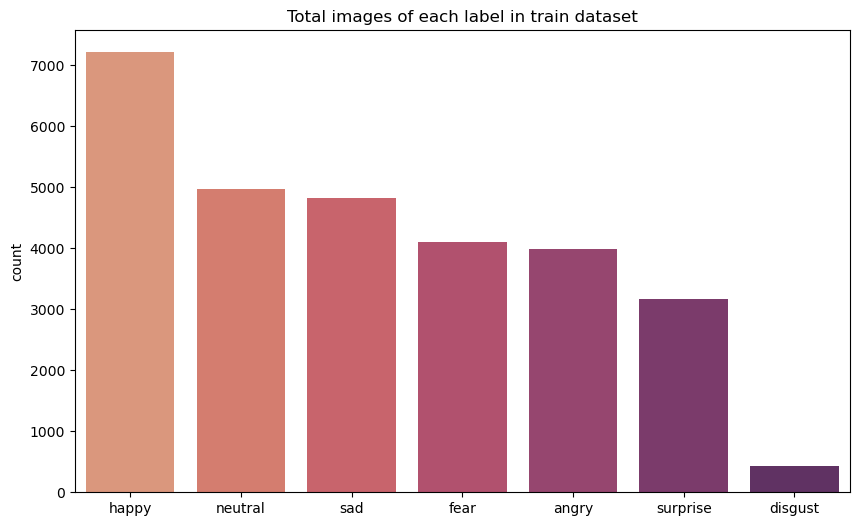

In [13]:
df = {}
for i in os.listdir(train_dir):
    directory = train_dir + i
    df[i] = len(os.listdir(directory))
df = pd.DataFrame(df, index=["total"]).transpose().sort_values("total", ascending=False)

plt.figure(figsize=(10,6))
sns.barplot(x=df.index, y="total", palette="flare", data=df)
plt.ylabel("count")
plt.title("Total images of each label in train dataset")
plt.show()

C:\Users\alekh\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


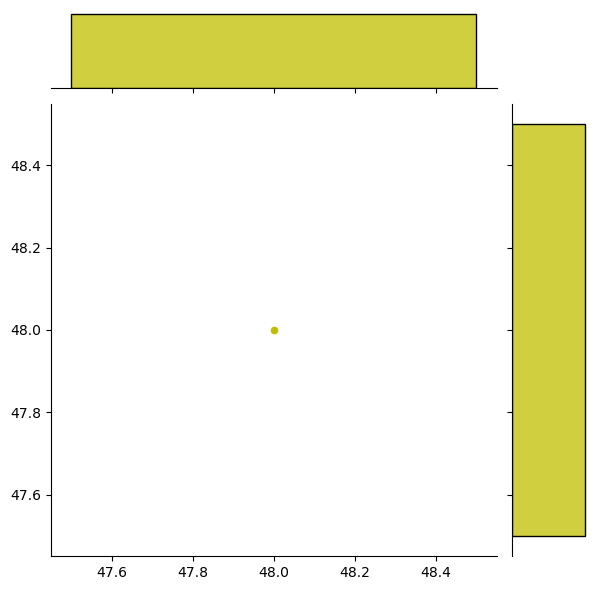

In [14]:
happy = os.listdir(train_dir+'happy/')
dim1, dim2 = [], []

for img_filename in happy:
    img = imread(train_dir+'happy/'+img_filename)
    d1, d2 = img.shape
    dim1.append(d1)
    dim2.append(d2)

img_shape = (int(np.mean(dim1)), int(np.mean(dim2)), 1)
sns.jointplot(dim1, dim2,color='y')
plt.show()

In [15]:
# Data Preprocessing
train_gen = ImageDataGenerator(rescale=1/255,
                                rotation_range=40,
                                width_shift_range=0.2,
                                height_shift_range=0.2,
                                shear_range=0.2,
                                zoom_range=0.2,
                                horizontal_flip=True,
                                fill_mode='nearest')

test_gen = ImageDataGenerator(rescale=1/255)

img_shape = (int(np.mean(dim1)), int(np.mean(dim2)), 1)

train_generator = train_gen.flow_from_directory(directory=train_dir,
                                                target_size=(img_shape[0], img_shape[1]),
                                                color_mode='grayscale',
                                                batch_size=64,
                                                class_mode='categorical',
                                                shuffle=True)

test_generator = test_gen.flow_from_directory(directory=test_dir,
                                                target_size=(img_shape[0], img_shape[1]),
                                                color_mode='grayscale',
                                                batch_size=64,
                                                class_mode='categorical',
                                                shuffle=False)

Found 28709 images belonging to 7 classes.
Found 7178 images belonging to 7 classes.


In [16]:
# Create the Model
model = Sequential()

model.add(Conv2D(filters=64, kernel_size=(3,3), padding='same', activation='relu', input_shape=img_shape))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.2))

model.add(Conv2D(filters=128, kernel_size=(3,3), padding='same', activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.2))

model.add(Conv2D(filters=512, kernel_size=(3,3), padding='same', activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.2))

model.add(Conv2D(filters=512, kernel_size=(3,3), padding='same', activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.2))

model.add(Flatten())

model.add(Dense(512, activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(units=len(os.listdir(train_dir)), activation='softmax'))

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 48, 48, 64)        640       
                                                                 
 batch_normalization (Batch  (None, 48, 48, 64)        256       
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 24, 24, 64)        0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 24, 24, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 24, 24, 128)       73856     
                                                                 
 batch_normalization_1 (Bat  (None, 24, 24, 128)       5

In [18]:


# Create the legacy Adam optimizer with a learning rate and decay
optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=0.0001, decay=1e-6)

# Compile the model
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])


In [19]:
steps_per_epoch = train_generator.n // train_generator.batch_size
validation_steps = test_generator.n // test_generator.batch_size
num_epochs = 20

history = model.fit(train_generator,
                       epochs=num_epochs,
                    verbose=1,
                    #callbacks=callbacks,
                    validation_data=test_generator,
                    steps_per_epoch=steps_per_epoch,
                    validation_steps=validation_steps)

Epoch 1/20
448/448 [==============================] - 5121s 11s/step - loss: 1.8841 - accuracy: 0.2318 - val_loss: 2.1660 - val_accuracy: 0.2533
Epoch 2/20
448/448 [==============================] - 3714s 8s/step - loss: 1.8056 - accuracy: 0.2447 - val_loss: 1.8024 - val_accuracy: 0.2602
Epoch 3/20
448/448 [==============================] - 3762s 8s/step - loss: 1.7868 - accuracy: 0.2570 - val_loss: 1.7474 - val_accuracy: 0.2766
Epoch 4/20
448/448 [==============================] - 2641s 6s/step - loss: 1.7754 - accuracy: 0.2625 - val_loss: 1.7330 - val_accuracy: 0.3005
Epoch 5/20
448/448 [==============================] - 2268s 5s/step - loss: 1.7620 - accuracy: 0.2742 - val_loss: 1.6993 - val_accuracy: 0.3133
Epoch 6/20
448/448 [==============================] - 2253s 5s/step - loss: 1.7488 - accuracy: 0.2826 - val_loss: 1.6812 - val_accuracy: 0.3235
Epoch 7/20
448/448 [==============================] - 4523s 10s/step - loss: 1.7258 - accuracy: 0.2974 - val_loss: 1.5950 - val_accurac

In [20]:
model.save("model.h5")

C:\Users\alekh\anaconda3\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [21]:
# Evaluate the model
test_loss, test_acc = model.evaluate(test_generator)
print("validation accuracy :", str(test_acc*100)+"%")
print("validation loss :", test_loss)

113/113 [==============================] - 3233s 29s/step - loss: 1.1972 - accuracy: 0.5369
validation accuracy : 53.69183421134949%
validation loss : 1.1971551179885864


In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 6))
ax[0].plot(epochs, acc, 'y', label='Training accuracy')
ax[0].plot(epochs, val_acc, 'magenta', label='Validation accuracy')
ax[0].legend(loc=0)
ax[1].plot(epochs, loss, 'y', label='Training loss')
ax[1].plot(epochs, val_loss, 'magenta', label='Validation loss')
ax[1].legend(loc=0)

plt.suptitle('Training and validation')
plt.show()

113/113 [==============================] - 223s 2s/step


C:\Users\alekh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\alekh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\alekh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

       angry       0.40      0.50      0.45       958
     disgust       0.00      0.00      0.00       111
        fear       0.37      0.08      0.13      1024
       happy       0.74      0.86      0.79      1774
     neutral       0.44      0.61      0.51      1233
         sad       0.46      0.28      0.35      1247
    surprise       0.55      0.81      0.66       831

    accuracy                           0.54      7178
   macro avg       0.42      0.45      0.41      7178
weighted avg       0.51      0.54      0.50      7178





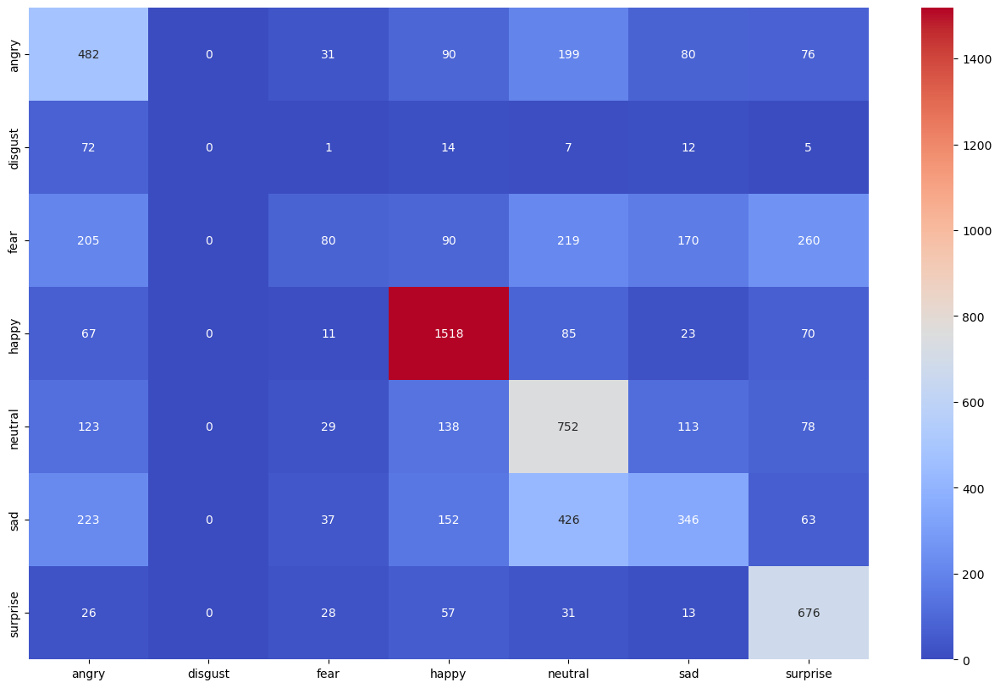

In [22]:
# confusion matrix
from sklearn.metrics import classification_report, confusion_matrix

y_pred = np.argmax(model.predict(test_generator), axis=-1)
print(classification_report(test_generator.classes, y_pred, target_names=test_generator.class_indices.keys()), end='\n\n\n')

cm = confusion_matrix(test_generator.classes, y_pred)
plt.figure(figsize=(16,10))
sns.heatmap(cm, cmap=plt.cm.coolwarm, annot=True, fmt='.0f', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.show()

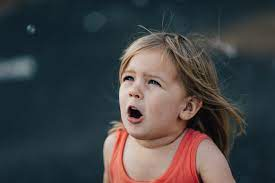

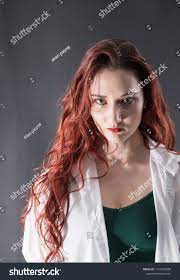

In [54]:
# Testing our model with new image
image1 = cv2.imread("download.jpg")
image2 = cv2.imread("angerwomen.jpg")
from IPython.display import Image
display(Image(filename='download.jpg'))
display(Image(filename='angerwomen.jpg'))


In [63]:
import cv2
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import BatchNormalization
from tensorflow.python.keras.utils.generic_utils import CustomObjectScope
import os

# # load the trained model
with CustomObjectScope({'BatchNormalization': BatchNormalization}):
    model = load_model("model.h5")

# A list of emoticon categories
EMOTIONS = ['Angry', 'Disgust', 'Happy', 'Sad', 'Surprise', 'Neutral']

# Load image
img1 = image1
img2 =image2

# Trim the image to 48 x 48, and turn the grayscale image, normalization
frame1 = cv2.resize(img1,(48,48),interpolation=cv2.INTER_BITS2)
frame2 = cv2.resize(img2,(48,48),interpolation=cv2.INTER_BITS2)
gray1 = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY) / 255.0
gray2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY) / 255.0



# Reinvent the image dimension
gray1 = gray1.reshape(1,48,48,1)
gray2 = gray2.reshape(1,48,48,1)

# Output the prediction
predicts1 = model.predict(gray1)[0]
predicts2=model.predict(gray2)[0]

label1 = EMOTIONS[predicts1.argmax()]
label2 = EMOTIONS[predicts2.argmax()]

for (i,j) in zip(range(7),EMOTIONS):
    predictss = predicts1[i]
    print("{:^10s}".format(j)+"prediction rate is   {0:.2f}%".format(predictss))
print( "\n\n The system considers this expression to be:",label1)
for (i,j) in zip(range(7),EMOTIONS):
    print("{:^10s}".format(j)+"prediction rate is   {0:.2f}%".format(pred))
    
    pred=predicts2[i]
print( "\n\n The system considers this expression to be:",label2)
songmood(label1)
songmood(label2)

1/1 [==============================] - 0s 105ms/step
  Angry   prediction rate is   0.15%
 Disgust  prediction rate is   0.02%
  Happy   prediction rate is   0.10%
   Sad    prediction rate is   0.16%
 Surprise prediction rate is   0.29%
 Neutral  prediction rate is   0.26%


 The system considers this expression to be: Surprise
  Angry   prediction rate is   0.14%
 Disgust  prediction rate is   0.32%
  Happy   prediction rate is   0.00%
   Sad    prediction rate is   0.06%
 Surprise prediction rate is   0.27%
 Neutral  prediction rate is   0.21%


 The system considers this expression to be: Angry
Now Playing: C:\Users\alekh\inkem inkem inkem kaavale from geetha govindham surprise song.mp3


Now Playing: C:\Users\alekh\jaabilamma niku antha kopama from pelli angry song.mp3


In [60]:
# Song Recommdation
def songmood(label):
    if (label=='Angry'):
        path=r'C:\Users\alekh\jaabilamma niku antha kopama from pelli angry song.mp3'
        filename = path.split('/')[-1]  
        print("Now Playing:", filename)
    
        audio = Audio(filename=path,autoplay=True)
        
        audio = Audio(filename=filename,autoplay=True)
        display(audio)
    
    elif (label=='Disgust'):
        path=r'C:\Users\alekh\jigelu Rani disgust.mp3'
        filename = path.split('/')[-1]  
        print("Now Playing:", filename)
    
        audio = Audio(filename=path,autoplay=True)
        display(audio)
    
    elif (label=="Happy"):
        path=r"C:\Users\alekh\chitti from jaati ratnaalu happy song.mp3"
        filename = path.split('/')[-1]  
        print("Now Playing:", filename)
    
        audio = Audio(filename=path+ d,autoplay=True)
        display(audio)
    
    elif (label=='Sad'):
        path=r"C:\Users\alekh\adigaa adigaa from ninnu kori sad song.mp3"
        filename = path.split('/')[-1]  
        print("Now Playing:", filename)
    
        audio = Audio(filename=path,autoplay=True)
        display(audio)
    elif (label=='Surprise'):
        path=r"C:\Users\alekh\inkem inkem inkem kaavale from geetha govindham surprise song.mp3"
        filename = path.split('/')[-1]  
        print("Now Playing:", filename)
        audio = Audio(filename=filename, autoplay=True)
        display(audio)
    
    elif (label=='Neutral'):
        path=r"C:\Users\alekh\Na Roja Nuvve from kushi neutral song.mp3"
        filename = path.split('/')[-1]  
        print("Now Playing:", filename)
    
        audio = Audio(filename=path,autoplay=True)
        display(audio)